In [ ]:
#  Setup and Data Download
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gzip
from io import StringIO
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# --- Download the data directly to Colab ---
# Define the URL and local file path
data_url = "https://ftp.ncbi.nlm.nih.gov/geo/series/GSE45nnn/GSE45827/matrix/GSE45827_series_matrix.txt.gz"
file_path = "GSE45827_series_matrix.txt.gz"

print(f"Downloading data from: {data_url}")
try:
    # Use pandas read_csv directly with the URL for gzipped files (it handles gzip and HTTP)
    import requests
    response = requests.get(data_url)
    response.raise_for_status() # Raise an exception for bad status codes
    with open(file_path, 'wb') as f:
        f.write(response.content)
    print(f"'{file_path}' downloaded successfully.")
except requests.exceptions.RequestException as e:
    print(f"Error downloading the file: {e}")
except Exception as e:
    print(f"An unexpected error occurred during download: {e}")

'GSE45827_series_matrix.txt.gz' downloaded successfully.


In [ ]:
#Data Loading Function - CORRECTED METADATA PARSING
def load_geo_matrix(file_path):
    """Loads and parses a GEO series matrix .txt.gz file into a pandas DataFrame.
    Separates metadata from the expression data."""
    metadata = {}
    data_lines_raw = [] # Store all non-metadata lines initially
    with gzip.open(file_path, 'rt') as f: # 'rt' for read as text
        for line in f:
            stripped_line = line.strip()
            if stripped_line.startswith('!'):
                # This is a metadata line
                # Try to split by the first tab or space after '!'
                parts = stripped_line[1:].split('\t', 1) # Try tab first
                if len(parts) == 1: # If no tab, try space
                    parts = stripped_line[1:].split(' ', 1)
                if len(parts) == 2:
                    key = parts[0].strip()
                    value = parts[1].strip()
                    # Remove quotes from value if present
                    if value.startswith('"') and value.endswith('"'):
                        value = value[1:-1]
                    # Handle multi-line metadata values (e.g., !Sample_title, !Sample_characteristics_ch1)
                    if key in metadata:
                        # Append to list if key already exists, useful for !Sample_characteristics_ch1
                        if isinstance(metadata[key], list):
                            metadata[key].append(value)
                        else:
                            metadata[key] = [metadata[key], value] # Convert to list if first duplicate
                    else:
                        metadata[key] = value
                # else: print(f"Warning: Could not parse metadata line: {stripped_line}") # Debugging
            elif stripped_line: # If it's not a metadata line AND not empty
                data_lines_raw.append(stripped_line)
    # --- Find the true start of the data matrix ---
    data_start_index = -1
    for i, line in enumerate(data_lines_raw):
        if line.startswith('ID_REF\t'): # Specific header for this dataset
            data_start_index = i
            break
    if data_start_index == -1:
        if data_lines_raw:
             data_start_index = 0 # Assume the first non-metadata line is the header
             print("Warning: 'ID_REF\\t' not found. Assuming the first non-metadata line is the data header.")
        else:
            raise ValueError("Could not find any data lines after metadata. File might be malformed or empty.")
    # Read the data into a DataFrame
    data_str = "\n".join(data_lines_raw[data_start_index:])
    df = pd.read_csv(StringIO(data_str), sep='\t', index_col=0, header=0)
    return df, metadata

# --- Execute data loading ---
file_path = "GSE45827_series_matrix.txt.gz" # Ensure file_path is defined if running this cell independently
try:
    expression_data, geo_metadata = load_geo_matrix(file_path)
    print("\nSuccessfully loaded expression data and metadata!")
    print("\nExpression Data Head (first 5 rows, first 5 columns):")
    print(expression_data.iloc[:5, :5])
    print("\nShape of Expression Data (genes x samples):", expression_data.shape)
    print("\nMetadata Keys:")
    # This loop will print the keys if they are successfully parsed
    if geo_metadata: # Check if dictionary is not empty
        for key in geo_metadata.keys():
            if isinstance(geo_metadata[key], list) and len(geo_metadata[key]) > 5:
                print(f"- {key}: {geo_metadata[key][:5]}... (first 5 elements)")
            else:
                print(f"- {key}: {geo_metadata[key]}")
    else:
        print("No metadata keys found. Parsing error or file structure unexpected.")
except Exception as e:
    print(f"Error during data loading: {e}")


Successfully loaded expression data and metadata!

Expression Data Head (first 5 rows, first 5 columns):
           GSM1116084  GSM1116085  GSM1116086  GSM1116087  GSM1116088
ID_REF                                                               
1007_s_at     9.47065     9.67440    10.20800    10.11420    11.16360
1053_at       8.36311     8.72194     7.78601     9.44537     7.71242
117_at        5.95426     7.02523     6.39671     4.56023     5.29008
1294_at       6.02119     7.24581     6.85310     5.42786     7.51120
1316_at       3.22997     3.29352     3.26204     3.34766     3.59086

Shape of Expression Data (genes x samples): (29873, 155)

Metadata Keys:
- Series_title: Expression data from Breast cancer subtypes
- Series_geo_accession: GSE45827
- Series_status: Public on Mar 24 2016
- Series_submission_date: Apr 05 2013
- Series_last_update_date: Mar 25 2019
- Series_pubmed_id: 27006338
- Series_summary: Expression data from Breast cancer subtypes
- Series_overall_design: In a 


--- Visualizing Initial Data Distributions ---


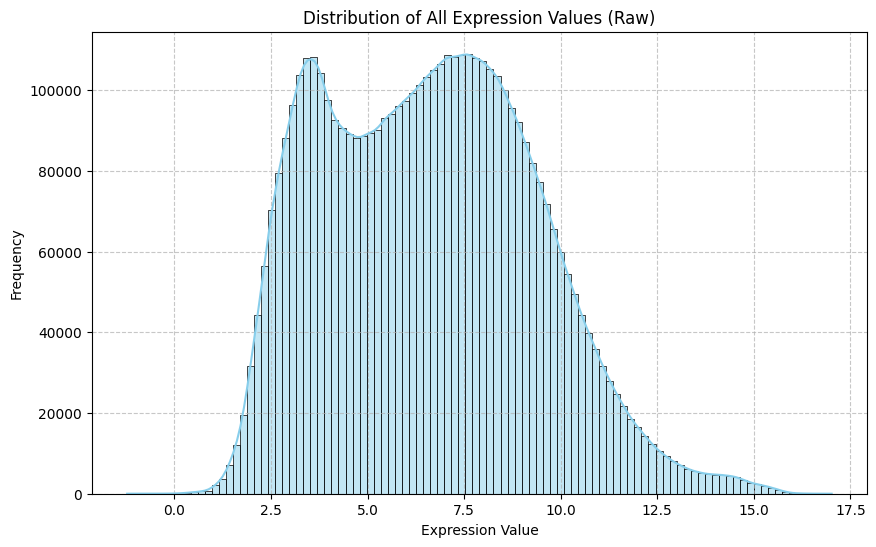

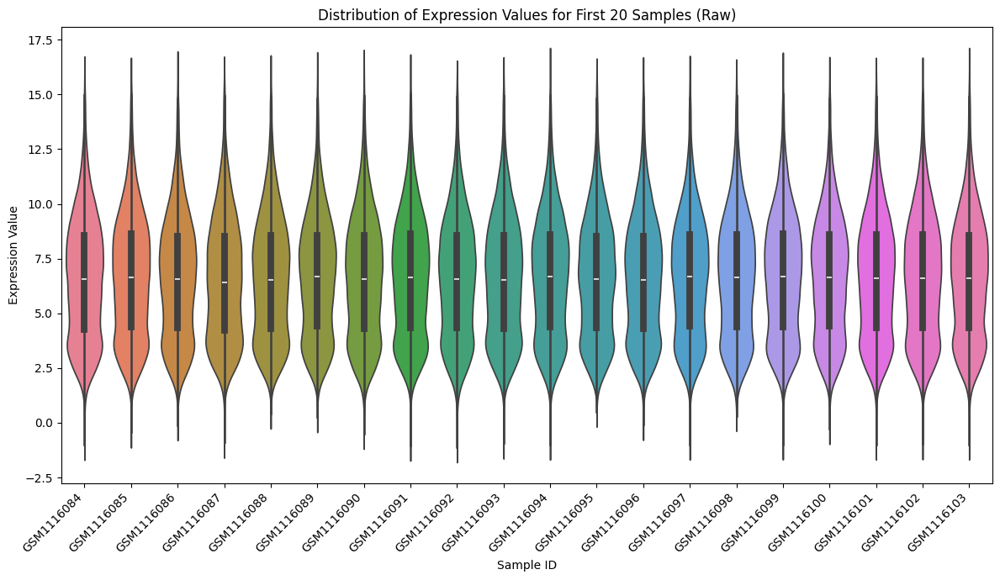

In [ ]:
# Initial Data Visualization

if 'expression_data' in locals() and expression_data is not None:
    # Ensure data is numeric for plotting
    expression_data_numeric = expression_data.apply(pd.to_numeric, errors='coerce')
    expression_data_numeric.fillna(expression_data_numeric.mean(), inplace=True)
    print("\n--- Visualizing Initial Data Distributions ---")
    # Plot 1: Distribution of All Expression Values
    plt.figure(figsize=(10, 6))
    sns.histplot(expression_data_numeric.values.flatten(), bins=100, kde=True, color='skyblue')
    plt.title('Distribution of All Expression Values (Raw)')
    plt.xlabel('Expression Value')
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()
    # Plot 2: Distribution of Expression Values for First 20 Samples (Violin Plot)
    plt.figure(figsize=(12, 7))
    sns.violinplot(data=expression_data_numeric.iloc[:, :20]) # Plot first 20 samples to avoid clutter
    plt.title('Distribution of Expression Values for First 20 Samples (Raw)')
    plt.xlabel('Sample ID')
    plt.ylabel('Expression Value')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
else:
    print("Expression data not loaded. Please run previous cells.")

In [ ]:
#  Data Preprocessing - FINAL REVISION FOR METADATA ACCESS
if 'expression_data' in locals() and expression_data is not None and 'geo_metadata' in locals() and geo_metadata is not None:
    print("\n--- Starting Data Preprocessing ---")
    # 1. Transpose the data: ML models expect samples as rows, features (genes) as columns.
    X = expression_data.T
    print("Shape of X (samples x features) BEFORE numeric conversion and imputation:", X.shape)
    # 2. Convert to numeric and handle missing values
    X = X.apply(pd.to_numeric, errors='coerce') # Coerce non-numeric to NaN
    print("Total missing values before imputation:", X.isnull().sum().sum())

    # Impute missing values with the mean of each feature/gene (column)
    X.fillna(X.mean(), inplace=True)
    print("Total missing values after imputation:", X.isnull().sum().sum())
    print("Data types after processing (should primarily be float64):")
    print(X.dtypes.value_counts())

    # 3. Extracting the Target Variable (y)
    print("\n--- Extracting Target Variable (y) from Metadata ---")
    # Sample IDs from X.index are reliable and match the GSM IDs
    sample_ids = X.index.tolist()
    print(f"Using X.index for sample IDs. Total: {len(sample_ids)}. First 5: {sample_ids[:5]}")

    # --- Robustly get the full string for Sample_source_name_ch1 ---
    source_names_list = []
    source_name_full_string = ""
    if 'Sample_source_name_ch1' in geo_metadata:
        val = geo_metadata['Sample_source_name_ch1']
        if isinstance(val, list) and len(val) > 0:
            source_name_full_string = val[0].strip() # It's a list, take first element
            print(f"Found 'Sample_source_name_ch1' as a list. Using its first element.")
        elif isinstance(val, str):
            source_name_full_string = val.strip() # It's a direct string
            print(f"Found 'Sample_source_name_ch1' as a direct string.")

        if source_name_full_string:
            source_names_list = [s.strip().replace('"', '') for s in source_name_full_string.split('\t')]
            print(f"Parsed {len(source_names_list)} source names from 'Sample_source_name_ch1'. First 5: {source_names_list[:5]}")
        else:
            print("Warning: 'Sample_source_name_ch1' value is empty after retrieval. Cannot extract specific subtypes.")
            source_names_list = ['Unknown'] * len(sample_ids) # Fallback if value is empty
    else:
        print("Error: 'Sample_source_name_ch1' not found in metadata. Cannot extract specific subtypes.")
        source_names_list = ['Unknown'] * len(sample_ids) # Fallback if key not found

    # --- Robustly get the full string for Sample_characteristics_ch1 ---
    characteristics_list = []
    char_full_string = ""
    if 'Sample_characteristics_ch1' in geo_metadata:
        val = geo_metadata['Sample_characteristics_ch1']
        if isinstance(val, list) and len(val) > 0:
            char_full_string = val[0].strip()
            print(f"Found 'Sample_characteristics_ch1' as a list. Using its first element.")
        elif isinstance(val, str):
            char_full_string = val.strip()
            print(f"Found 'Sample_characteristics_ch1' as a direct string.")
        if char_full_string:
            characteristics_list = [c.strip().replace('"', '') for c in char_full_string.split('\t')]
            print(f"Parsed {len(characteristics_list)} characteristics from 'Sample_characteristics_ch1'. First 5: {characteristics_list[:5]}")
        else:
            print("Warning: 'Sample_characteristics_ch1' value is empty after retrieval. May miss some classifications.")
            characteristics_list = [''] * len(sample_ids) # Fallback if value is empty
    else:
        print("Warning: 'Sample_characteristics_ch1' not found in metadata. May miss some classifications.")
        characteristics_list = [''] * len(sample_ids) # Fallback if key not found
    # Initialize a dictionary to store sample_id -> subtype mapping
    sample_subtype_map = {}
    # Ensure all lists are of the same length
    min_len = min(len(sample_ids), len(source_names_list), len(characteristics_list))
    if min_len < len(sample_ids):
        print(f"Warning: Mismatch in number of sample annotations. Truncating to {min_len} samples.")
        sample_ids = sample_ids[:min_len]
        source_names_list = source_names_list[:min_len]
        characteristics_list = characteristics_list[:min_len]
    if len(sample_ids) > 0:
        for i in range(len(sample_ids)):
            sample_id = sample_ids[i]
            source_name = source_names_list[i].lower() # Convert to lower for case-insensitive matching
            characteristic = characteristics_list[i].lower() # Convert to lower
            subtype = None
            # Prioritize Sample_source_name_ch1 for specific tumor subtypes
            if 'basal tumor sample' in source_name:
                subtype = 'Triple Negative'
            elif 'her2 tumor sample' in source_name:
                subtype = 'HER2'
            elif 'luminal a tumor sample' in source_name:
                subtype = 'Luminal A'
            elif 'luminal b tumor sample' in source_name:
                subtype = 'Luminal B'
            elif 'normal' in source_name: # Covers "Human Normal"
                subtype = 'Normal'
            elif 'cellline' in source_name: # Covers "Human CellLine"
                subtype = 'Cell Line'
            # Fallback to Sample_characteristics_ch1 for general categories if not caught above
            if subtype is None:
                if 'diagnosis: none (normal)' in characteristic:
                    subtype = 'Normal'
                elif 'cell line:' in characteristic:
                    subtype = 'Cell Line'
                elif 'diagnosis: breast cancer' in characteristic:# If it's breast cancer but no specific subtype found,this means it wasn't specified in source_name either.   
                    subtype = 'Undetermined Tumor'                # Given the dataset description, it implies it should have one of the 4 subtypes. We will mark it as 'Undetermined Tumor'
            if subtype is None: # If still no subtype after all checks
                subtype = 'Uncategorized'
            sample_subtype_map[sample_id] = subtype
        print(f"Successfully processed {len(sample_subtype_map)} sample subtypes.")
    else:
        print(f"Error: No samples to process for subtype extraction.")
        # Set y to empty to prevent further errors if this step fails critically
        y_aligned = pd.Series([])
        X_aligned = pd.DataFrame([])
    # Create the y Series, reindexing to align with X (important for matching samples)
    y = pd.Series(sample_subtype_map, name='subtype').reindex(X.index)

    # Drop samples from X and y that do not have a defined subtype (NaN in y)
    initial_samples = X.shape[0]
    X_aligned, y_aligned = X.align(y.dropna(), join='inner', axis=0)
    print(f"Removed {initial_samples - X_aligned.shape[0]} samples due to missing subtype labels (NaNs).")
    print("\nNumber of samples with a determined subtype:", y_aligned.shape[0])
    print("Subtype Distribution (y_aligned.value_counts()):")
    print(y_aligned.value_counts())

    # Only proceed if there are samples remaining
    if y_aligned.shape[0] > 0:
        # Convert string labels to numerical labels for machine learning
        le = LabelEncoder()
        y_encoded = pd.Series(le.fit_transform(y_aligned), index=y_aligned.index, name='target_variable')
        print("\nEncoded Target Variable (y_encoded) Head:")
        print(y_encoded.head())
        print("\nEncoded Subtype Mapping:")
        for i, label in enumerate(le.classes_):
            print(f"{label}: {i}")

        # 4. Standardization of X (Features)
        print("\n--- Standardizing Features (X) ---")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_aligned) # Use X_aligned here!
        X_scaled_df = pd.DataFrame(X_scaled, columns=X_aligned.columns, index=X_aligned.index)
        print("Scaled Data Head (first 5 samples, first 5 genes):")
        print(X_scaled_df.iloc[:5, :5])
        print("Shape of X after scaling:", X_scaled_df.shape)
    else:
        print("No samples remaining after filtering for subtypes. Cannot standardize or build model.")
        X_scaled_df = pd.DataFrame([]) # Ensure X_scaled_df is empty if no samples
else:
    print("Data or metadata not loaded. Please run previous cells.")


--- Starting Data Preprocessing ---
Shape of X (samples x features) BEFORE numeric conversion and imputation: (155, 29873)
Total missing values before imputation: 0
Total missing values after imputation: 0
Data types after processing (should primarily be float64):
float64    29873
Name: count, dtype: int64

--- Extracting Target Variable (y) from Metadata ---
Using X.index for sample IDs. Total: 155. First 5: ['GSM1116084', 'GSM1116085', 'GSM1116086', 'GSM1116087', 'GSM1116088']
Found 'Sample_source_name_ch1' as a direct string.
Parsed 155 source names from 'Sample_source_name_ch1'. First 5: ['Human Basal Tumor Sample', 'Human Basal Tumor Sample', 'Human Her2 Tumor Sample', 'Human Basal Tumor Sample', 'Human Her2 Tumor Sample']
Found 'Sample_characteristics_ch1' as a list. Using its first element.
Parsed 155 characteristics from 'Sample_characteristics_ch1'. First 5: ['diagnosis: Breast cancer', 'diagnosis: Breast cancer', 'diagnosis: Breast cancer', 'diagnosis: Breast cancer', 'diagn

In [9]:
!pip install plotly

In [ ]:
#Visualization After Preprocessing (PCA - 3 Components)
import numpy as np
import matplotlib.pyplot as plt # Still needed if we use other matplotlib plots later
from matplotlib.colors import ListedColormap # Still needed if we use other matplotlib plots later
import seaborn as sns # Still needed if we use other seaborn plots later
from sklearn.neighbors import KNeighborsClassifier # Keep existing imports
from sklearn.decomposition import PCA # Keep existing imports
# Import Plotly
import plotly.express as px
import plotly.graph_objects as go

if 'X_scaled_df' in locals() and expression_data is not None and 'y_encoded' in locals() and le is not None:
    print("\n--- Visualizing Data After Preprocessing (PCA - 3 Components) (Interactive) ---")
    # Perform PCA on the scaled data - requesting 3 components
    pca = PCA(n_components=3)
    principal_components = pca.fit_transform(X_scaled_df)
    pca_df = pd.DataFrame(data=principal_components,columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'],index=X_scaled_df.index)

    # Combine PCA results with encoded labels for plotting
    combined_pca_y = pca_df.join(y_encoded, how='inner')

    # Add the original subtype names back to the DataFrame for better hover info
    combined_pca_y['Subtype'] = le.inverse_transform(combined_pca_y['target_variable'])

    # --- Interactive 3D Plotting with Plotly ---
    fig = px.scatter_3d(combined_pca_y,
                        x='Principal Component 1',
                        y='Principal Component 2',
                        z='Principal Component 3',
                        color='Subtype', # Color points by original subtype name
                        symbol='Subtype', # Use symbols for distinct groups
                        opacity=0.8,
                        title='Interactive PCA of Gene Expression Data by Subtype (3 Components)',
                        hover_data={'Principal Component 1':':.2f', # Customize hover info format
                                    'Principal Component 2':':.2f',
                                    'Principal Component 3':':.2f',
                                    'Subtype':True,
                                    'target_variable': False # Hide encoded label from hover
                                   }
                       )

    # Update layout for better labels and title
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=40), # Adjust margins
                      scene = dict(
                          xaxis_title=f'PC 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)',
                          yaxis_title=f'PC 2 ({pca.explained_variance_ratio_[1]*100:.2f}%)',
                          zaxis_title=f'PC 3 ({pca.explained_variance_ratio_[2]*100:.2f}%)'
                      ),
                      hovermode='closest' # Show hover info for the closest point
                     )

    # Display the interactive plot
    fig.show()
    print(f"\nExplained variance by PC1: {pca.explained_variance_ratio_[0]:.4f}")
    print(f"Explained variance by PC2: {pca.explained_variance_ratio_[1]:.4f}")
    print(f"Explained variance by PC3: {pca.explained_variance_ratio_[2]:.4f}")
    print(f"Total explained variance by first 3 PCs: {(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1] + pca.explained_variance_ratio_[2]):.4f}")

else:
    print("Scaled features (X_scaled_df) or encoded labels (y_encoded) not available. Please run previous cells.")


--- Visualizing Data After Preprocessing (PCA - 3 Components) (Interactive) ---



Explained variance by PC1: 0.1432
Explained variance by PC2: 0.0936
Explained variance by PC3: 0.0598
Total explained variance by first 3 PCs: 0.2966


In [ ]:
# Model Building and Evaluation PC=3 (using PCA components)
# Ensure X_scaled_df, y_encoded, and le are available from previous cells.
# We also need pca_df which contains the 3 principal components.
if 'pca_df' in locals() and 'y_encoded' in locals() and 'le' in locals():
    print("\n--- Starting Model Building (using 3 PCA Components) ---")
    # Use the 3 PCA components as features
    X_ml = pca_df
    y_ml = y_encoded # The target variable remains the same
    print(f"Shape of X (features = 3 PCA components) for ML:", X_ml.shape)
    print(f"Shape of y (target variable) for ML:", y_ml.shape)

    # Split the data into training and testing sets
    # stratify=y_ml ensures that the train and test sets have roughly the same proportion of target classes
    X_train, X_test, y_train, y_test = train_test_split(X_ml, y_ml, test_size=0.2, random_state=42, stratify=y_ml)

    print(f"Train set size: {X_train.shape[0]} samples")
    print(f"Test set size: {X_test.shape[0]} samples")

    # Initialize and train a RandomForestClassifier
    model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1) # n_jobs=-1 uses all available cores
    print("\nTraining RandomForestClassifier on PCA components...")
    model.fit(X_train, y_train)
    print("Training complete.")
    # Make predictions
    y_pred = model.predict(X_test)
    # Evaluate the model
    print("\n--- Model Evaluation ---")
    print("Classification Report:")
    # Use le.classes_ for target_names to get a readable report with original subtype names
    print(classification_report(y_test, y_pred, target_names=le.classes_))
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")

    # Feature Importance Note:
    # Feature importance on PCA components is less interpretable than on original genes.
    # It indicates how much each component contributes to the model's decision.
    print("\nFeature importance on PCA components (PC1, PC2, PC3) is less directly interpretable than on original genes.")
else:
    print("Scaled features (pca_df) or encoded labels (y_encoded) not available for model building. Please run previous cells, including the 3-component PCA.")


--- Starting Model Building (using 3 PCA Components) ---
Shape of X (features = 3 PCA components) for ML: (155, 3)
Shape of y (target variable) for ML: (155,)
Train set size: 124 samples
Test set size: 31 samples

Training RandomForestClassifier on PCA components...
Training complete.

--- Model Evaluation ---
Classification Report:
                 precision    recall  f1-score   support

      Cell Line       1.00      1.00      1.00         3
           HER2       1.00      0.83      0.91         6
      Luminal A       0.86      1.00      0.92         6
      Luminal B       0.83      0.83      0.83         6
         Normal       1.00      1.00      1.00         2
Triple Negative       1.00      1.00      1.00         8

       accuracy                           0.94        31
      macro avg       0.95      0.94      0.94        31
   weighted avg       0.94      0.94      0.94        31

Accuracy: 0.9355

Note: Feature importance on PCA components (PC1, PC2, PC3) is less direct

--- Starting Model Comparison (using 3 PCA Components) ---
Train set size (PCA features): 124 samples
Test set size (PCA features): 31 samples

--- Training Random Forest (PCA) ---
Training complete in 0.26 seconds.

--- Evaluating Random Forest (PCA) ---
Classification Report:
                 precision    recall  f1-score   support

      Cell Line       1.00      1.00      1.00         3
           HER2       1.00      0.83      0.91         6
      Luminal A       0.86      1.00      0.92         6
      Luminal B       0.83      0.83      0.83         6
         Normal       1.00      1.00      1.00         2
Triple Negative       1.00      1.00      1.00         8

       accuracy                           0.94        31
      macro avg       0.95      0.94      0.94        31
   weighted avg       0.94      0.94      0.94        31

Accuracy: 0.9355

--- Training Logistic Regression (PCA) ---
Training complete in 0.01 seconds.

--- Evaluating Logistic Regression (PCA) ---
Classi

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.

<ipython-input-15-592364984>:153: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




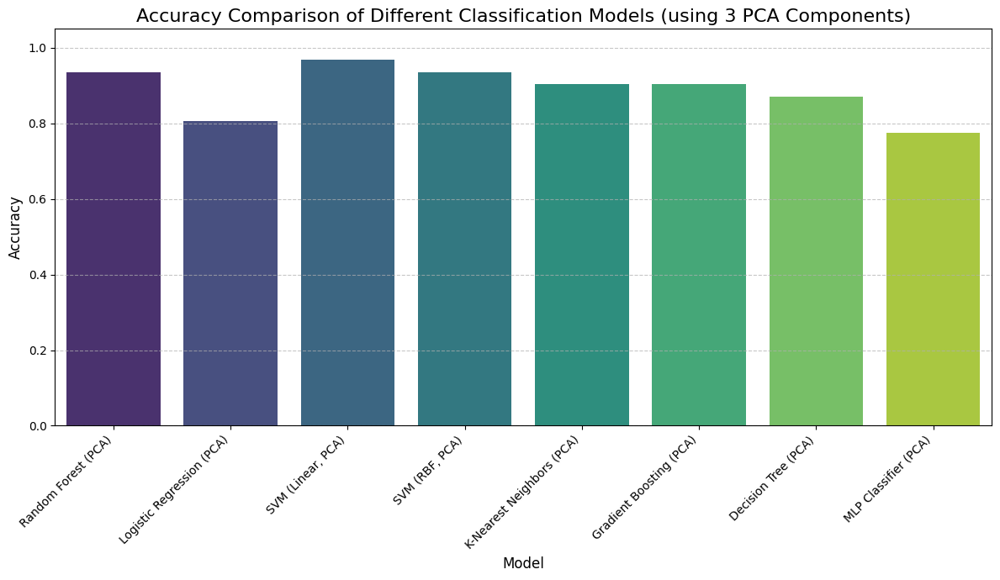


--- Model Comparison Complete ---


In [ ]:
# Model Comparison and Visualization PC=3 (using PCA components)
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
# Import various classifiers
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

print("--- Starting Model Comparison (using 3 PCA Components) ---")

# Ensure pca_df, y_encoded, and le are available from previous cells.
try:
    if 'pca_df' not in locals() or 'y_encoded' not in locals() or 'le' not in locals():
        raise NameError("pca_df, y_encoded, or le not found. Please run previous data preprocessing and 3-component PCA cells.")

    # Use the 3 PCA components for the comparison
    X_ml = pca_df
    y_ml = y_encoded

    # Re-create train/test split to ensure consistency if this cell is run independently
    # Use the same random state as in Cell 6 for reproducibility
    X_train_pca, X_test_pca, y_train_encoded, y_test_encoded = train_test_split(
        X_ml, y_ml, test_size=0.2, random_state=42, stratify=y_ml
    )
    print(f"Train set size (PCA features): {X_train_pca.shape[0]} samples")
    print(f"Test set size (PCA features): {X_test_pca.shape[0]} samples")
except NameError as e:
    print(f"Error: {e}")
    print("Cannot proceed with model comparison. Please ensure previous cells (especially Cell 4 and Cell 5's 3-component PCA part) have been executed.")
    try:
        get_ipython().ex('exit()')
    except NameError:
        pass

def train_and_evaluate_model(model, X_train, y_train, X_test, y_test, model_name="Model", verbose=False):
    """
    Trains a given model and evaluates its performance, returning metrics.
    Assumes 'le' (LabelEncoder) is globally available for inverse_transform.
    Includes option for verbose output during training.
    """
    print(f"\n--- Training {model_name} ---")
    start_time = time.time()
    if verbose:
        # Not all models support verbose training output directly via fit(verbose=True).
        # For models that do (like MLPClassifier), the verbose parameter
        # during model initialization controls this.
        model.fit(X_train, y_train)
    else:
        model.fit(X_train, y_train)
    end_time = time.time()
    print(f"Training complete in {end_time - start_time:.2f} seconds.")
    print(f"\n--- Evaluating {model_name} ---")
    y_pred = model.predict(X_test)

    # Convert encoded predictions back to original labels for report readability
    # Check if le is defined, otherwise use encoded labels directly for report
    if 'le' in globals():
        y_test_labels = le.inverse_transform(y_test)
        y_pred_labels = le.inverse_transform(y_pred)
        target_names = le.classes_
    else:
        print("Warning: LabelEncoder 'le' not found. Classification report will use encoded labels.")
        y_test_labels = y_test
        y_pred_labels = y_pred
        target_names = None # Let classification_report use default if no names

    # Ensure target_names is handled correctly if some classes are missing in test set (zero_division)
    report = classification_report(y_test_labels, y_pred_labels, target_names=target_names, zero_division=0)
    accuracy = accuracy_score(y_test_labels, y_pred_labels)
    print("Classification Report:")
    print(report)
    print(f"Accuracy: {accuracy:.4f}")
    return accuracy, report

# Dictionary to store accuracy for comparison
results = {}
# --- Train and Evaluate Different Models using PCA Components ---

# 1. Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_accuracy, _ = train_and_evaluate_model(rf_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "Random Forest (PCA)")
results["Random Forest (PCA)"] = rf_accuracy

# 2. Logistic Regression
# Using 'liblinear' solver which is good for smaller datasets and L1/L2 penalties
lr_model = LogisticRegression(max_iter=1000, random_state=42, solver='liblinear')
lr_accuracy, _ = train_and_evaluate_model(lr_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "Logistic Regression (PCA)")
results["Logistic Regression (PCA)"] = lr_accuracy

# 3. Support Vector Machine (Linear Kernel)
svm_linear_model = SVC(kernel='linear', random_state=42, probability=True) # probability=True for consistent API with others
svm_linear_accuracy, _ = train_and_evaluate_model(svm_linear_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "SVM (Linear, PCA)")
results["SVM (Linear, PCA)"] = svm_linear_accuracy

# 4. Support Vector Machine (RBF Kernel)
svm_rbf_model = SVC(kernel='rbf', random_state=42, probability=True)
svm_rbf_accuracy, _ = train_and_evaluate_model(svm_rbf_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "SVM (RBF, PCA)")
results["SVM (RBF, PCA)"] = svm_rbf_accuracy

# 5. K-Nearest Neighbors
knn_model = KNeighborsClassifier(n_neighbors=5) # Using default n_neighbors=5
knn_accuracy, _ = train_and_evaluate_model(knn_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "K-Nearest Neighbors (PCA)")
results["K-Nearest Neighbors (PCA)"] = knn_accuracy

# 6. Gradient Boosting Classifier
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
gb_accuracy, _ = train_and_evaluate_model(gb_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "Gradient Boosting (PCA)")
results["Gradient Boosting (PCA)"] = gb_accuracy

# 7. Decision Tree Classifier
dt_model = DecisionTreeClassifier(random_state=42)
dt_accuracy, _ = train_and_evaluate_model(dt_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "Decision Tree (PCA)")
results["Decision Tree (PCA)"] = dt_accuracy

# 8. Multi-layer Perceptron (Neural Network)
# Smaller input layer needed now (3 nodes instead of ~30k)
# Adjust hidden layer sizes accordingly, or keep same relative size
mlp_model = MLPClassifier(hidden_layer_sizes=(10, 5), max_iter=500, random_state=42, verbose=True) # verbose=True to see loss
mlp_accuracy, _ = train_and_evaluate_model(mlp_model, X_train_pca, y_train_encoded, X_test_pca, y_test_encoded, "MLP Classifier (PCA)", verbose=True)
results["MLP Classifier (PCA)"] = mlp_accuracy


# --- Model Comparison Visualization ---
print("\n--- All Model Accuracies (using 3 PCA Components) ---")
for model_name, accuracy in results.items():
    print(f"{model_name}: Accuracy = {accuracy:.4f}")

plt.figure(figsize=(12, 7))
sns.barplot(x=list(results.keys()), y=list(results.values()), palette='viridis')
plt.title('Accuracy Comparison of Different Classification Models (using 3 PCA Components)', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.ylim(0, 1.05) # Set y-axis limit slightly above 1.0 for better visual
plt.xticks(rotation=45, ha='right', fontsize=10) # Rotate labels for better readability
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show()

print("\n--- Model Comparison Complete ---")

In [18]:
!pip install graphviz

--- Visualizing a Single Decision Tree from the Random Forest (using 3 PCA Components) (Interactive via Graphviz) ---

Displaying interactive tree visualization (may require notebook features like SVG rendering):


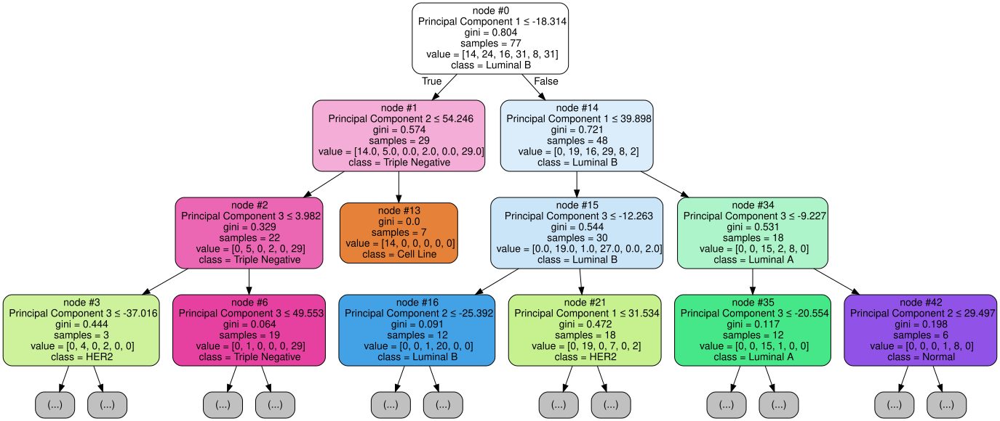


--- Tree Visualization Complete ---
Visualized tree splitting based on 3 principal components, limited to depth 3.
Note: Interactivity (zoom/pan) depends on your notebook environment's support for SVG or other vector graphic rendering.


In [19]:
# Visualize a Single Decision Tree from Random Forest PC=3 (Interactive via Graphviz)

import matplotlib.pyplot as plt # Keep for potential other plots, but not used for the tree itself here
from sklearn import tree
import graphviz # Import the graphviz library

print("--- Visualizing a Single Decision Tree from the Random Forest (using 3 PCA Components) (Interactive via Graphviz) ---")

# Ensure rf_model (trained on PCA), pca_df, and le are available from previous cells
# The rf_model used here should be the one trained on pca_df, likely from the second version of Cell 6 or Cell 7
try:
    # Check for the specific model trained on PCA components
    if 'rf_model' not in locals() or rf_model is None:
         print("Warning: 'rf_model' not found in global scope. Attempting to re-train RandomForestClassifier on PCA data.")
         if 'pca_df' not in locals() or pca_df is None:
             raise NameError("pca_df (PCA features) not found. Please ensure the 3-component PCA cell (Cell 5 PC=3) was run successfully.")
         if 'y_encoded' not in locals() or y_encoded is None:
              raise NameError("y_encoded (encoded labels) not found. Please ensure Cell 4 was run successfully.")
         if 'le' not in locals() or le is None:
              raise NameError("LabelEncoder (le) not found. Please ensure Cell 4 was run successfully.")
         # Re-train the RF model on PCA
         X_ml = pca_df
         y_ml = y_encoded
         X_train_pca, X_test_pca, y_train_encoded, y_test_encoded = train_test_split(
            X_ml, y_ml, test_size=0.2, random_state=42, stratify=y_ml # Use same split params)
         rf_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
         rf_model.fit(X_train_pca, y_train_encoded)
         print("Re-training complete.")
    elif not hasattr(rf_model, 'estimators_') or rf_model.n_features_in_ != pca_df.shape[1]:
         print("Warning: Existing 'rf_model' does not appear to be trained on 3 PCA components. Re-training for visualization.")
         X_ml = pca_df
         y_ml = y_encoded
         X_train_pca, X_test_pca, y_train_encoded, y_test_encoded = train_test_split(
            X_ml, y_ml, test_size=0.2, random_state=42, stratify=y_ml)
         rf_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
         rf_model.fit(X_train_pca, y_train_encoded)
         print("Re-training complete.")
    # Ensure necessary variables for visualization are available after checks/retrain
    if 'pca_df' not in locals() or pca_df is None:
         raise NameError("pca_df is still missing after checks.")
    if 'le' not in locals() or le is None:
         raise NameError("le is still missing after checks.")
    # Select the first tree from the forest
    # Ensure rf_model is the one trained on 3 PCA components
    try:
        single_tree = rf_model.estimators_[0]
    except (AttributeError, IndexError):
        raise RuntimeError("Could not access estimators_ from rf_model after ensuring prerequisites.")
except NameError as e:
    print(f"Error during prerequisite check or re-training: {e}")
    print("Cannot proceed with tree visualization. Make sure all previous necessary cells have been executed.")
    try:
        get_ipython().ex('exit()') # Use ex() to exit the cell in Colab
    except NameError:
        pass # Not in IPython environment
except RuntimeError as e:
    print(f"Runtime error: {e}")
    print("Cannot proceed with tree visualization.")
    try:
        get_ipython().ex('exit()')
    except NameError:
        pass

# Get feature names (PCA component names) and class names (subtypes)
feature_names = pca_df.columns.tolist() # Use pca_df column names here
class_names = le.classes_.tolist()
# --- Export the tree to Graphviz format ---
# max_depth can be used here too if the tree is very deep, but with 3 features it's unlikely
# We will set a max_depth for clarity even with few features
max_depth_for_export = 3 # Limit depth for visualization clarity
dot_data = tree.export_graphviz(single_tree,
                                feature_names=feature_names,
                                class_names=class_names,
                                filled=True,
                                rounded=True,
                                special_characters=True,
                                impurity=True, # Show impurity
                                node_ids=True, # Show node IDs
                                proportion=False, # Show counts, not proportions
                                max_depth=max_depth_for_export # Limit depth for export
                               )

# --- Create a Graphviz object and render it ---
graph = graphviz.Source(dot_data)

# Display the Graphviz object
print("\nDisplaying interactive tree visualization (may require notebook features like SVG rendering):")
display(graph) 

print("\n--- Tree Visualization Complete ---")
print(f"Visualized tree splitting based on {len(feature_names)} principal components, limited to depth {max_depth_for_export}.")
print("Note: Interactivity (zoom/pan) depends on your notebook environment's support for SVG or other vector graphic rendering.")

In [20]:
# Colab Cell 10: Visualize KNN Decision Regions (using PCA=3) (Interactive via Plotly)

import numpy as np
import matplotlib.pyplot as plt # Keep if needed for other plots, but not for this one
from matplotlib.colors import ListedColormap # Keep if needed for other plots
import seaborn as sns # Keep if needed for other plots

from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA # Keep if needed for other PCA
from sklearn.preprocessing import StandardScaler # Keep if needed for standardizing
from sklearn.model_selection import train_test_split # Keep if needed for splitting

# Import Plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots # Useful for multiple plots, though not strictly needed here

print("--- Visualizing KNN Decision Regions (using 3 PCA Components) (Interactive) ---")

# Ensure pca_df, y_encoded, and le are available from previous cells.
try:
    if 'pca_df' not in locals() or pca_df is None:
        raise NameError("pca_df (PCA features) not found. Please ensure the 3-component PCA cell (Cell 5 PC=3) was run successfully.")
    if 'y_encoded' not in locals() or y_encoded is None:
        raise NameError("y_encoded (encoded labels) not found. Please ensure Cell 4 was run successfully.")
    if 'le' not in locals() or le is None:
        raise NameError("LabelEncoder (le) not found. Please ensure Cell 4 was run successfully.")

    X_ml = pca_df
    y_ml = y_encoded

    # --- Re-train KNN on PCA data just for visualization if needed ---
    # You might have trained this in Cell 7 PC=3 comparison, but let's make this cell robust
    knn_model = KNeighborsClassifier(n_neighbors=5) # Using n_neighbors=5 as in the comparison
    print("\nTraining KNeighborsClassifier on PCA data for visualization...")
    knn_model.fit(X_ml, y_ml) # Fit on the whole PCA data for visualization purposes
    print("Training complete.")


except NameError as e:
    print(f"Error during prerequisite check or re-training: {e}")
    print("Cannot proceed with visualization. Make sure all previous necessary cells have been executed.")
    try:
        get_ipython().ex('exit()') # Use ex() to exit the cell in Colab
    except NameError:
        pass # Not in IPython environment
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    try:
        get_ipython().ex('exit()')
    except NameError:
        pass

# Define the range for the grid based on the PCA data
pc1_min, pc1_max = X_ml.iloc[:, 0].min() - 1, X_ml.iloc[:, 0].max() + 1
pc2_min, pc2_max = X_ml.iloc[:, 1].min() - 1, X_ml.iloc[:, 1].max() + 1
pc3_min, pc3_max = X_ml.iloc[:, 2].min() - 1, X_ml.iloc[:, 2].max() + 1

# Create a meshgrid of points in the 3D PCA space
# Use a reasonable number of points for the grid, balancing detail and performance
# Too many points can make the interactive plot very slow
n_grid_points = 50 # Number of points along each dimension (e.g., 50^3 = 125000 points)
pc1_grid = np.linspace(pc1_min, pc1_max, n_grid_points)
pc2_grid = np.linspace(pc2_min, pc2_max, n_grid_points)
pc3_grid = np.linspace(pc3_min, pc3_max, n_grid_points)

# Create the full 3D grid
PC1, PC2, PC3 = np.meshgrid(pc1_grid, pc2_grid, pc3_grid)

# Reshape the grid points into a list of (PC1, PC2, PC3) coordinates
grid_points = np.c_[PC1.ravel(), PC2.ravel(), PC3.ravel()]

print(f"\nClassifying {len(grid_points)} grid points to visualize decision regions...")
# Predict the class for each point on the grid
# Use a small batch size if predicting on many points to avoid high memory usage
batch_size = 10000
predicted_classes_encoded = []
for i in range(0, len(grid_points), batch_size):
    batch = grid_points[i:i+batch_size]
    predictions = knn_model.predict(batch)
    predicted_classes_encoded.extend(predictions)
predicted_classes_encoded = np.array(predicted_classes_encoded)
print("Classification complete.")

# Convert encoded predictions back to original labels for coloring
predicted_classes_labels = le.inverse_transform(predicted_classes_encoded)


# --- Create the interactive 3D plot using Plotly ---
# We can plot the grid points, colored by predicted class
# We can also add the original data points on top

# Data points scattered in the PCA space, colored by actual label
actual_data_trace = go.Scatter3d(
    x=X_ml.iloc[:, 0],
    y=X_ml.iloc[:, 1],
    z=X_ml.iloc[:, 2],
    mode='markers',
    name='Actual Data Points',
    marker=dict(
        size=5,
        color=y_ml, # Color by encoded actual label
        colorscale='Viridis', # Use the same colorscale as the grid for consistency
        opacity=0.8
    ),
    text=le.inverse_transform(y_ml), # Text on hover: actual subtype
    hoverinfo='text' # Show only the text on hover
)


# Grid points colored by predicted label to show decision regions
grid_trace = go.Scatter3d(
    x=grid_points[:, 0],
    y=grid_points[:, 1],
    z=grid_points[:, 2],
    mode='markers',
    name='Predicted Regions',
    marker=dict(
        size=2, # Smaller markers for the grid points
        color=predicted_classes_encoded, # Color by encoded predicted label
        colorscale='Viridis', # Use the same colorscale
        opacity=0.2 # Make grid points semi-transparent
    ),
    text=predicted_classes_labels, # Text on hover: predicted subtype
    hoverinfo='text' # Show only the text on hover
)


# Create the layout
layout = go.Layout(
    title='KNN Decision Regions and Actual Data Points (3 PCA Components)',
    margin=dict(l=0, r=0, b=0, t=40),
    scene=dict(
        xaxis=dict(title=f'Principal Component 1'), # Simplified labels for layout
        yaxis=dict(title=f'Principal Component 2'),
        zaxis=dict(title=f'Principal Component 3'),
        # You might add the explained variance % in annotations or title if desired
    ),
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

# Create the figure and add the traces
fig = go.Figure(data=[grid_trace, actual_data_trace], layout=layout)

# Update axes titles with explained variance % using annotations
# Get explained variance ratios from the PCA object used previously
# (assuming the 'pca' object from Cell 5 PC=3 is still available)
if 'pca' in locals() and hasattr(pca, 'explained_variance_ratio_') and len(pca.explained_variance_ratio_) >= 3:
     fig.update_layout(
        scene=dict(
            xaxis_title=f'Principal Component 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)',
            yaxis_title=f'Principal Component 2 ({pca.explained_variance_ratio_[1]*100:.2f}%)',
            zaxis_title=f'Principal Component 3 ({pca.explained_variance_ratio_[2]*100:.2f}%)'
        )
     )
else:
    print("Warning: Could not retrieve PCA explained variance ratios to add to axis labels.")


# Display the interactive plot
print("\nDisplaying interactive 3D scatter plot showing decision regions and data points:")
fig.show()

print("\n--- Visualization Complete ---")
print(f"Grid resolution: {n_grid_points}^3 = {n_grid_points**3} points.")
print("The background points show the predicted class for each point in the grid.")
print("The larger, opaque points show the actual data samples.")

--- Visualizing KNN Decision Regions (using 3 PCA Components) (Interactive) ---

Training KNeighborsClassifier on PCA data for visualization...
Training complete.

Classifying 125000 grid points to visualize decision regions...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does 

Classification complete.

Displaying interactive 3D scatter plot showing decision regions and data points:



--- Visualization Complete ---
Grid resolution: 50^3 = 125000 points.
The background points show the predicted class for each point in the grid.
The larger, opaque points show the actual data samples.


In [23]:
# Colab Cell 11: Visualize Logistic Regression Decision Regions (using PCA=3) (Interactive via Plotly)

import numpy as np
import matplotlib.pyplot as plt # Keep if needed for other plots
# No need for ListedColormap here as Plotly handles colorscales
import seaborn as sns # Keep if needed

from sklearn.linear_model import LogisticRegression # Import LogisticRegression
from sklearn.decomposition import PCA # Keep if needed for other PCA
from sklearn.preprocessing import StandardScaler # Keep if needed for standardizing
from sklearn.model_selection import train_test_split # Keep if needed for splitting

# Import Plotly
import plotly.graph_objects as go
import plotly.express as px


print("--- Visualizing Logistic Regression Decision Regions (using 3 PCA Components) (Interactive) ---")

# Ensure pca_df, y_encoded, and le are available from previous cells.
try:
    if 'pca_df' not in locals() or pca_df is None:
        raise NameError("pca_df (PCA features) not found. Please ensure the 3-component PCA cell (Cell 5 PC=3) was run successfully.")
    if 'y_encoded' not in locals() or y_encoded is None:
        raise NameError("y_encoded (encoded labels) not found. Please ensure Cell 4 was run successfully.")
    if 'le' not in locals() or le is None:
        raise NameError("LabelEncoder (le) not found. Please ensure Cell 4 was run successfully.")

    X_ml = pca_df
    y_ml = y_encoded

    # --- Re-train Logistic Regression on PCA data for visualization if needed ---
    # You might have trained this in Cell 7 PC=3 comparison, but let's make this cell robust
    # Use the same parameters as in the comparison cell
    lr_model = LogisticRegression(max_iter=1000, random_state=42, solver='liblinear')
    print("\nTraining Logistic Regression on PCA data for visualization...")
    lr_model.fit(X_ml, y_ml) # Fit on the whole PCA data for visualization purposes
    print("Training complete.")


except NameError as e:
    print(f"Error during prerequisite check or re-training: {e}")
    print("Cannot proceed with visualization. Make sure all previous necessary cells have been executed.")
    try:
        get_ipython().ex('exit()') # Use ex() to exit the cell in Colab
    except NameError:
        pass # Not in IPython environment
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    try:
        get_ipython().ex('exit()')
    except NameError:
        pass


# Define the range for the grid based on the PCA data
# Use a small margin around the data points
pc1_min, pc1_max = X_ml.iloc[:, 0].min() - 1, X_ml.iloc[:, 0].max() + 1
pc2_min, pc2_max = X_ml.iloc[:, 1].min() - 1, X_ml.iloc[:, 1].max() + 1
pc3_min, pc3_max = X_ml.iloc[:, 2].min() - 1, X_ml.iloc[:, 2].max() + 1

# Create a meshgrid of points in the 3D PCA space
# Use a reasonable number of points for the grid, balancing detail and performance
# Too many points can make the interactive plot very slow
n_grid_points = 50 # Number of points along each dimension (e.g., 50^3 = 125000 points)
pc1_grid = np.linspace(pc1_min, pc1_max, n_grid_points)
pc2_grid = np.linspace(pc2_min, pc2_max, n_grid_points)
pc3_grid = np.linspace(pc3_min, pc3_max, n_grid_points)

# Create the full 3D grid
PC1, PC2, PC3 = np.meshgrid(pc1_grid, pc2_grid, pc3_grid)

# Reshape the grid points into a list of (PC1, PC2, PC3) coordinates
grid_points = np.c_[PC1.ravel(), PC2.ravel(), PC3.ravel()]

print(f"\nClassifying {len(grid_points)} grid points to visualize decision regions...")
# Predict the class for each point on the grid
# Use a small batch size if predicting on many points to avoid high memory usage
batch_size = 10000
predicted_classes_encoded = []
for i in range(0, len(grid_points), batch_size):
    batch = grid_points[i:i+batch_size]
    predictions = lr_model.predict(batch) # Use lr_model here
    predicted_classes_encoded.extend(predictions)
predicted_classes_encoded = np.array(predicted_classes_encoded)
print("Classification complete.")

# Convert encoded predictions back to original labels for coloring
predicted_classes_labels = le.inverse_transform(predicted_classes_encoded)


# --- Create the interactive 3D plot using Plotly ---
# We can plot the grid points, colored by predicted class
# We can also add the original data points on top

# Data points scattered in the PCA space, colored by actual label
actual_data_trace = go.Scatter3d(
    x=X_ml.iloc[:, 0],
    y=X_ml.iloc[:, 1],
    z=X_ml.iloc[:, 2],
    mode='markers',
    name='Actual Data Points',
    marker=dict(
        size=5,
        color=y_ml, # Color by encoded actual label
        colorscale='Viridis', # Use a consistent colorscale
        opacity=0.8
    ),
    text=le.inverse_transform(y_ml), # Text on hover: actual subtype
    hoverinfo='text' # Show only the text on hover
)
# Grid points colored by predicted label to show decision regions
grid_trace = go.Scatter3d(
    x=grid_points[:, 0],
    y=grid_points[:, 1],
    z=grid_points[:, 2],
    mode='markers',
    name='Predicted Regions',
    marker=dict(
        size=2, # Smaller markers for the grid points
        color=predicted_classes_encoded, # Color by encoded predicted label
        colorscale='Viridis', # Use the same colorscale
        opacity=0.2 # Make grid points semi-transparent
    ),
    text=predicted_classes_labels, # Text on hover: predicted subtype
    hoverinfo='text' # Show only the text on hover
)
# Create the layout
layout = go.Layout(
    title='Logistic Regression Decision Regions and Actual Data Points (3 PCA Components)',
    margin=dict(l=0, r=0, b=0, t=40),
    scene=dict(
        xaxis=dict(title=f'Principal Component 1'), # Simplified labels for layout initially
        yaxis=dict(title=f'Principal Component 2'),
        zaxis=dict(title=f'Principal Component 3'),
        # Add explained variance later if pca object is available
    ),
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)
# Create the figure and add the traces
fig = go.Figure(data=[grid_trace, actual_data_trace], layout=layout)

# Update axes titles with explained variance % using annotations
# Get explained variance ratios from the PCA object used previously
# (assuming the 'pca' object from Cell 5 PC=3 is still available)
if 'pca' in locals() and hasattr(pca, 'explained_variance_ratio_') and len(pca.explained_variance_ratio_) >= 3:
     fig.update_layout(
        scene=dict(
            xaxis_title=f'PC 1 ({pca.explained_variance_ratio_[0]*100:.2f}%)',
            yaxis_title=f'PC 2 ({pca.explained_variance_ratio_[1]*100:.2f}%)',
            zaxis_title=f'PC 3 ({pca.explained_variance_ratio_[2]*100:.2f}%)'
        )
     )
else:
    print("Warning: Could not retrieve PCA explained variance ratios to add to axis labels.")


# Display the interactive plot
print("\nDisplaying interactive 3D scatter plot showing decision regions and data points:")
fig.show()

print("\n--- Visualization Complete ---")
print(f"Grid resolution: {n_grid_points}^3 = {n_grid_points**3} points.")
print("The background points show the predicted class for each point in the grid.")
print("The larger, opaque points show the actual data samples.")

--- Visualizing Logistic Regression Decision Regions (using 3 PCA Components) (Interactive) ---

Training Logistic Regression on PCA data for visualization...
Training complete.

Classifying 125000 grid points to visualize decision regions...
Classification complete.

Displaying interactive 3D scatter plot showing decision regions and data points:


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have v


--- Visualization Complete ---
Grid resolution: 50^3 = 125000 points.
The background points show the predicted class for each point in the grid.
The larger, opaque points show the actual data samples.
